# This notebook outlines an approach to detect leukocyte impact of blood flow from linescan data. 

In [133]:
# i/o
import glob 

# image processing
import skimage.io as skio
import matplotlib.pyplot as plt
from dask_image.imread import imread
import cv2

# utils 
import numpy as np

save_path = '/Users/lauraberkowitz/github/linescan_counts/figures/'

### Helper functions

In [199]:
# Analysis 
def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))


# plotting 
def set_size(width, fraction=1, subplots=(1, 1)):
    """Set figure dimensions to avoid scaling in LaTeX.
    Parameters
    ----------
    width: float or string
            Document width in points, or string of predined document type
    fraction: float, optional
            Fraction of the width which you wish the figure to occupy
    subplots: array-like, optional
            The number of rows and columns of subplots.
    Returns
    -------
    fig_dim: tuple
            Dimensions of figure in inches
    """
    if width == 'thesis':
        width_pt = 426.79135
    elif width == 'beamer':
        width_pt = 307.28987
    else:
        width_pt = width
    # Width of figure (in pts)
    fig_width_pt = width_pt * fraction
    # Convert from pt to inches
    inches_per_pt = 1 / 72.27
    # Golden ratio to set aesthetic figure height
    # https://disq.us/p/2940ij3
    golden_ratio = (5**.5 - 1) / 2
    # Figure width in inches
    fig_width_in = fig_width_pt * inches_per_pt
    # Figure height in inches
    fig_height_in = fig_width_in * golden_ratio * (subplots[0] / subplots[1])
    return (fig_width_in, fig_height_in)   

## Identify files to load

In [3]:
# Identify files 
files = glob.glob('/Volumes/Samsung_T5/longlinescan/*.tif')
print(files)

['/Volumes/Samsung_T5/longlinescan/2201-befIso-CA1.tif', '/Volumes/Samsung_T5/longlinescan/2201-befIso-CA2.tif', '/Volumes/Samsung_T5/longlinescan/2201-befIso-CA3.tif', '/Volumes/Samsung_T5/longlinescan/2201-befIso-CA4.tif', '/Volumes/Samsung_T5/longlinescan/Composite1844_CA1AFTLS012.tif', '/Volumes/Samsung_T5/longlinescan/Composite1844_CA2AFTLS010.tif', '/Volumes/Samsung_T5/longlinescan/Composite1844_CA3AFTLS011.tif', '/Volumes/Samsung_T5/longlinescan/Composite1883_CA2AFTLS003.tif', '/Volumes/Samsung_T5/longlinescan/Composite1930_CA5AFTLS014.tif']


## Split channels (red = leukocytes, grey = RBC)

In [4]:
# load image
imstack1    = skio.imread(files[0], plugin="tifffile")
# separate channels and concatenate into one maxtrix 
grey = imstack1[:,1,:,:]
red = imstack1[:,0,:,:]

## Plot frames of the stacks for good measure

In [ ]:
fig, axs = plt.subplots(1,2, figsize=set_size('beamer', fraction=2, subplots=(1,2)))
fig.subplots_adjust(hspace =.2, wspace=-.25)
axs = axs.ravel()

axs[0].imshow(red[1,:,:],cmap = 'Reds')
axs[0].set_ylabel('Time (.6ms/pixel)')
axs[0].set_title('Red Channel (Leukocytes)')
axs[0].set_yticklabels([''])
axs[0].set_xticklabels([''])

axs[1].imshow(grey[1,:,:],cmap = 'binary_r')
axs[1].set_ylabel('')
axs[1].set_title('Grey Channel (RBCs)')
axs[1].set_yticklabels([''])
axs[1].set_xticklabels([''])

plt.savefig(save_path+'raw_linescan'+'.svg',dpi=300,bbox_inches='tight')


In [241]:
from skimage import exposure
# Adaptive Equalization
grey_adapteq = exposure.equalize_adapthist(grey.copy(), clip_limit=0.03)
red_adapteq = exposure.equalize_adapthist(red.copy(), clip_limit=0.03)


## Plot difference between raw and normalized eqposure results

/var/folders/tf/0srfd57x6tj1br3t7nr_5x5h0000gn/T/ipykernel_4540/1576745988.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_yticklabels([''])
/var/folders/tf/0srfd57x6tj1br3t7nr_5x5h0000gn/T/ipykernel_4540/1576745988.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_xticklabels([''])
/var/folders/tf/0srfd57x6tj1br3t7nr_5x5h0000gn/T/ipykernel_4540/1576745988.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_yticklabels([''])
/var/folders/tf/0srfd57x6tj1br3t7nr_5x5h0000gn/T/ipykernel_4540/1576745988.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_xticklabels([''])


[]

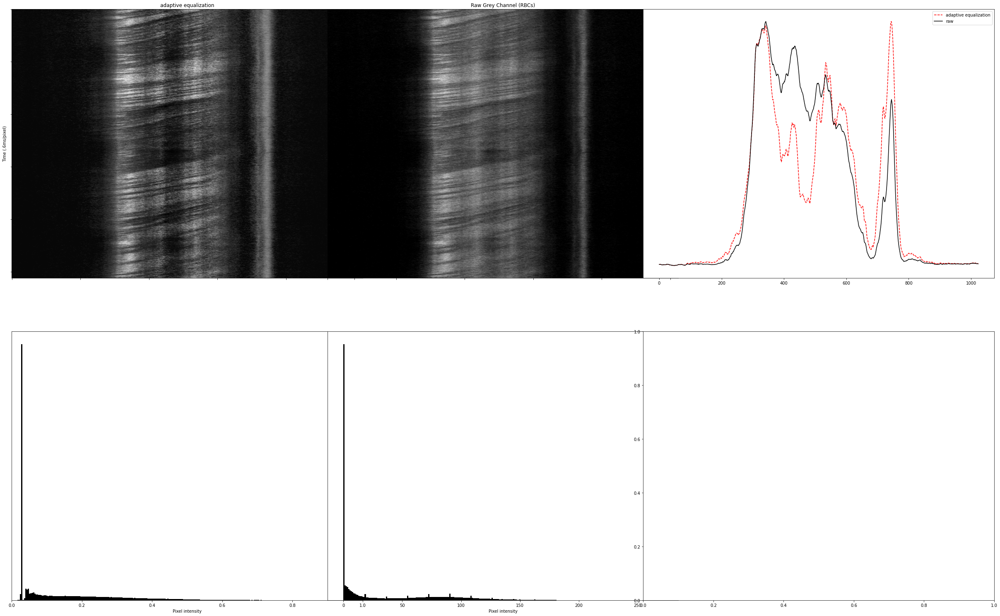

In [242]:
fig, axs = plt.subplots(2,3, figsize=set_size('beamer', fraction=10, subplots=(1,1)))
fig.subplots_adjust(hspace =.2, wspace=-.1)
axs = axs.ravel()

axs[0].imshow(grey_adapteq[1],cmap = 'binary_r')
axs[0].set_aspect(aspect='auto')
axs[0].set_ylabel('Time (.6ms/pixel)')
axs[0].set_title('adaptive equalization')
axs[0].set_yticklabels([''])
axs[0].set_xticklabels([''])

axs[1].imshow(grey[1,:,:],cmap = 'binary_r')
axs[1].set_aspect(aspect='auto')
axs[1].set_ylabel('')
axs[1].set_title('Raw Grey Channel (RBCs)')
axs[1].set_yticklabels([''])
axs[1].set_xticklabels([''])

axs[2].plot(normalize(np.sum(grey_adapteq[1],axis=0)),'r--')
axs[2].plot(normalize(np.sum(grey[1,:,:],axis=0)),color = 'k')
axs[2].legend(['adaptive equalization', 'raw'])

# Display histogram
axs[3].hist(grey_adapteq[1].ravel(), bins=256, histtype='bar', color='black')
# axs[3].ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
axs[3].set_xlabel('Pixel intensity')
axs[1].set_aspect(aspect='auto')
axs[3].set_xlim(0, 1)
axs[3].set_yticks([])

axs[4].hist(grey[1,:,:].ravel(), bins=256, histtype='bar', color='black')
# axs[4].ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
axs[4].set_xlabel('Pixel intensity')
axs[4].set_aspect(aspect='auto')
# axs[4].set_xlim(0, 1)
axs[4].set_yticks([])


/var/folders/tf/0srfd57x6tj1br3t7nr_5x5h0000gn/T/ipykernel_4540/3031887782.py:9: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_yticklabels([''])
/var/folders/tf/0srfd57x6tj1br3t7nr_5x5h0000gn/T/ipykernel_4540/3031887782.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_xticklabels([''])
/var/folders/tf/0srfd57x6tj1br3t7nr_5x5h0000gn/T/ipykernel_4540/3031887782.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_yticklabels([''])
/var/folders/tf/0srfd57x6tj1br3t7nr_5x5h0000gn/T/ipykernel_4540/3031887782.py:17: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_xticklabels([''])


[]

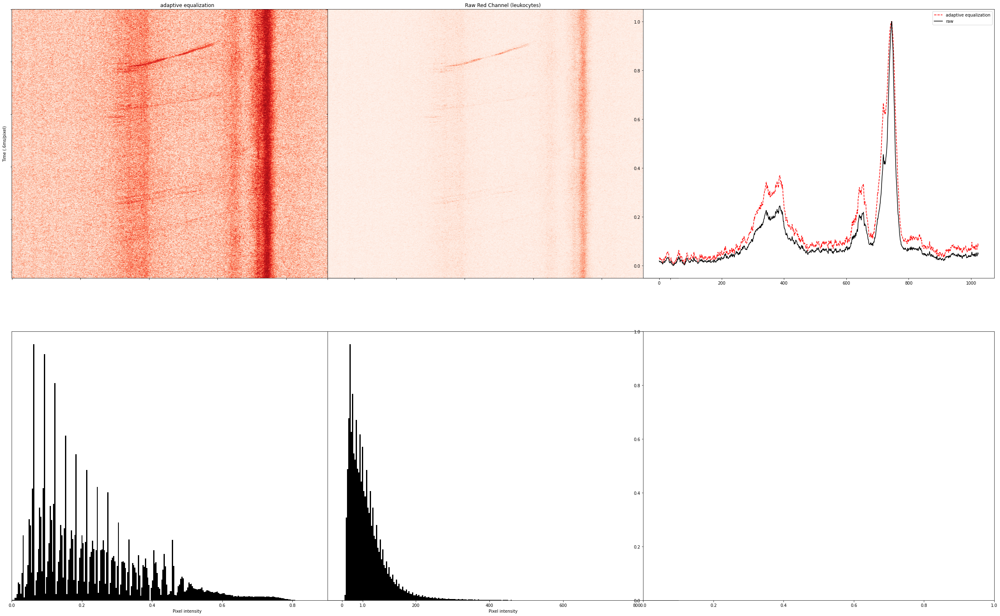

In [245]:
fig, axs = plt.subplots(2,3, figsize=set_size('beamer', fraction=10, subplots=(1,1)))
fig.subplots_adjust(hspace =.2, wspace=-.1)
axs = axs.ravel()

axs[0].imshow(red_adapteq[1],cmap = 'Reds')
axs[0].set_aspect(aspect='auto')
axs[0].set_ylabel('Time (.6ms/pixel)')
axs[0].set_title('adaptive equalization')
axs[0].set_yticklabels([''])
axs[0].set_xticklabels([''])

axs[1].imshow(red[1,:,:],cmap = 'Reds')
axs[1].set_aspect(aspect='auto')
axs[1].set_ylabel('')
axs[1].set_title('Raw Red Channel (leukocytes)')
axs[1].set_yticklabels([''])
axs[1].set_xticklabels([''])

axs[2].plot(normalize(np.sum(red_adapteq[1],axis=0)),'r--')
axs[2].plot(normalize(np.sum(red[1,:,:],axis=0)),color = 'k')
axs[2].legend(['adaptive equalization', 'raw'])

# Display histogram
axs[3].hist(red_adapteq[1].ravel(), bins=256, histtype='bar', color='black')
# axs[3].ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
axs[3].set_xlabel('Pixel intensity')
axs[1].set_aspect(aspect='auto')
axs[3].set_xlim(0, 1)
axs[3].set_yticks([])

axs[4].hist(red[1,:,:].ravel(), bins=256, histtype='bar', color='black')
# axs[4].ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
axs[4].set_xlabel('Pixel intensity')
axs[4].set_aspect(aspect='auto')
# axs[4].set_xlim(0, 1)
axs[4].set_yticks([])


## Create mask for signal area

In [ ]:
# Use intensity as a location 


## Remove constant noise through time-median subtraction (via [Kim et al 2012](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3383695/pdf/pone.0038590.pdf))

*Scrolling through frames - these changes drift, so lets apply median frame-by-frame*


In [246]:
red_sub = []
for frame in red_adapteq:
    col_avg = np.median(frame.copy(),axis = 0)
    red_sub.append(frame.copy() - col_avg)

grey_sub = []
for frame in grey_adapteq:
    col_avg = np.median(frame.copy(),axis = 0)
    grey_sub.append(frame.copy() - col_avg)


## Plot to check subtraction method

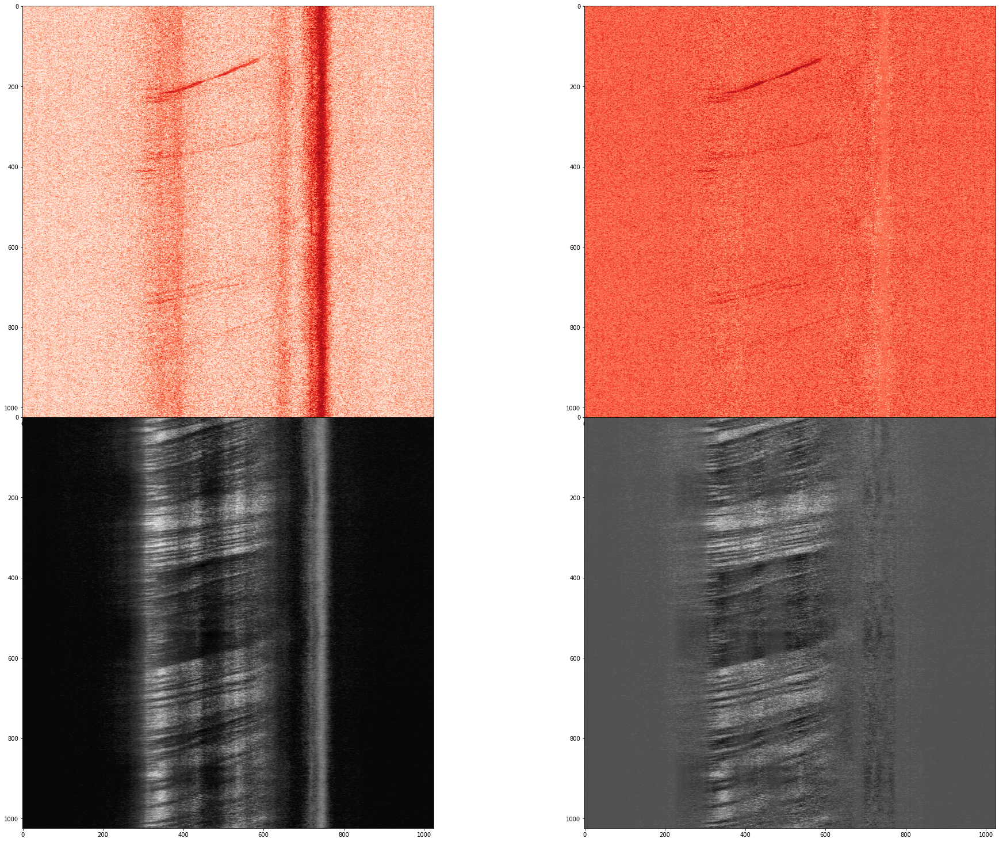

In [248]:
fig, axs = plt.subplots(2,2, figsize=set_size('beamer', fraction=10, subplots=(2,2)))
fig.subplots_adjust(hspace =0, wspace=-.3)
axs = axs.ravel()

axs[0].imshow(red_adapteq[1],cmap = "Reds")
axs[1].imshow(red_sub[1],cmap="Reds")
axs[2].imshow(grey_adapteq[1],cmap = "binary_r")
axs[3].imshow(grey_sub[1],cmap="binary_r")


## Apply gaussian blur to reduce noise before adapted threshold

In [257]:
# from skimage.filters import gaussian

# red_filt_gauss = []
# for frame in red_sub:
#     red_filt_gauss.append(gaussian(
#     frame, sigma=(1, 2), truncate=3.5, multichannel=True))

# grey_filt_gauss = []
# for frame in grey_sub:
#     grey_filt_gauss.append(gaussian(
#     frame, sigma=(1, 5), truncate=3.5, multichannel=True))

In [308]:
from skimage import filters 

red_filt = []
for frame in red_sub:
    red_filt.append(filters.median(frame.copy()))

grey_filt = []
for frame in grey_sub:
    grey_filt.append(filters.median(frame.copy()))


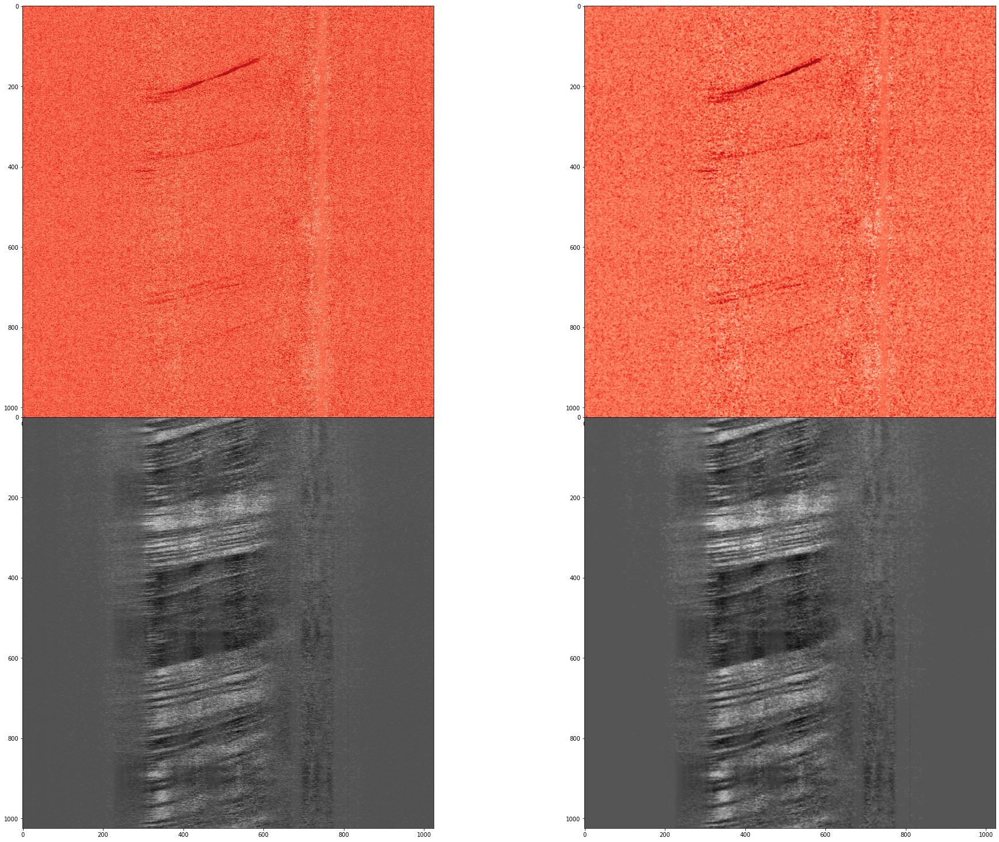

In [309]:
fig, axs = plt.subplots(2,2, figsize=set_size('beamer', fraction=10, subplots=(2,2)))
fig.subplots_adjust(hspace =0, wspace=-.3)
axs = axs.ravel()

axs[0].imshow(red_sub[1],cmap = "Reds")
axs[1].imshow(red_filt[1],cmap="Reds")
axs[2].imshow(grey_sub[1],cmap = "binary_r")
axs[3].imshow(grey_filt[1],cmap="binary_r")

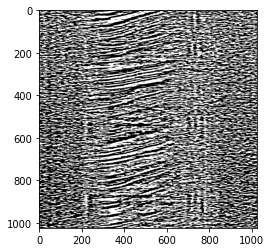

In [ ]:
image = grey_filt[1].copy()

adaptive_thresh = threshold_local(image, 35, offset=10,method = "median")
binary_adaptive = image > adaptive_thresh

plt.imshow(binary_adaptive,cmap="binary_r")
plt.show()

In [323]:
from skimage.filters import threshold_local
block_size = 65

red_filt_thresh = []
for frame in red_filt:
    adaptive_thresh = threshold_local(frame.copy(), block_size, offset=1,method = "median")
    red_filt_thresh.append(frame > adaptive_thresh)

grey_filt_thresh = []
for frame in grey_filt:
    adaptive_thresh = threshold_local(frame.copy(), block_size, offset=1,method = "median")
    grey_filt_thresh.append(frame > adaptive_thresh)


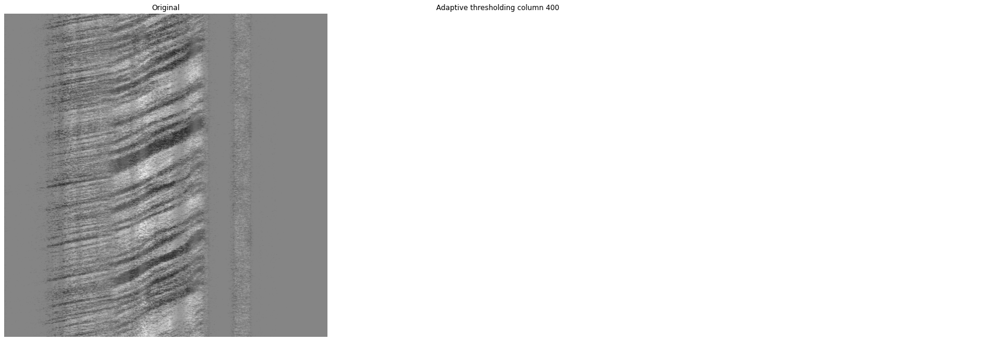

In [321]:
image = grey_sub[-100].copy()
binary_adaptive = grey_filt_thresh[-100].copy()

fig, axes = plt.subplots(ncols=3, figsize=(30, 10))
fig.subplots_adjust(hspace =0, wspace=0)
ax = axes.ravel()
plt.gray()

ax[0].imshow(image,cmap = "binary")
ax[0].set_title('Original')

ax[1].imshow(binary_adaptive,cmap="binary")
ax[1].set_title('Adaptive thresholding')

x = np.where(binary_adaptive[:,350]==0)
ax[1].scatter(np.ones_like(x)*350,x,color='r',s=.5)
ax[1].set_title('Adaptive thresholding column 400')

for a in ax:
    a.axis('off')

plt.show()

In [279]:
grey_filt_thresh

[array([[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]]),
 array([[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]]),
 array([[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  Tr

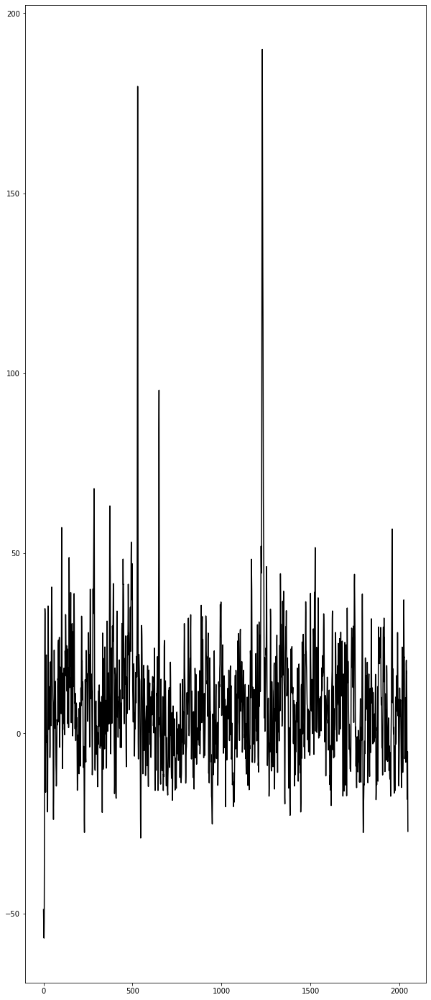

In [111]:
np.shape(red_filt_gauss_vec)

plt.figure(figsize=(10,25))
plt.plot(red_filt_gauss_vec[0:1024*2,400],color='k')

## Apply median filter

In [15]:
from skimage import filters 

red_filt = []
for frame in red_filt_thresh:
    red_filt.append(filters.median(frame.copy()))

grey_filt = []
for frame in grey_filt_thresh:
    grey_filt.append(filters.median(frame.copy()))


## Plot to check median filter

Text(0.5, 1.0, 'Median Filter on time-median subtracted image')

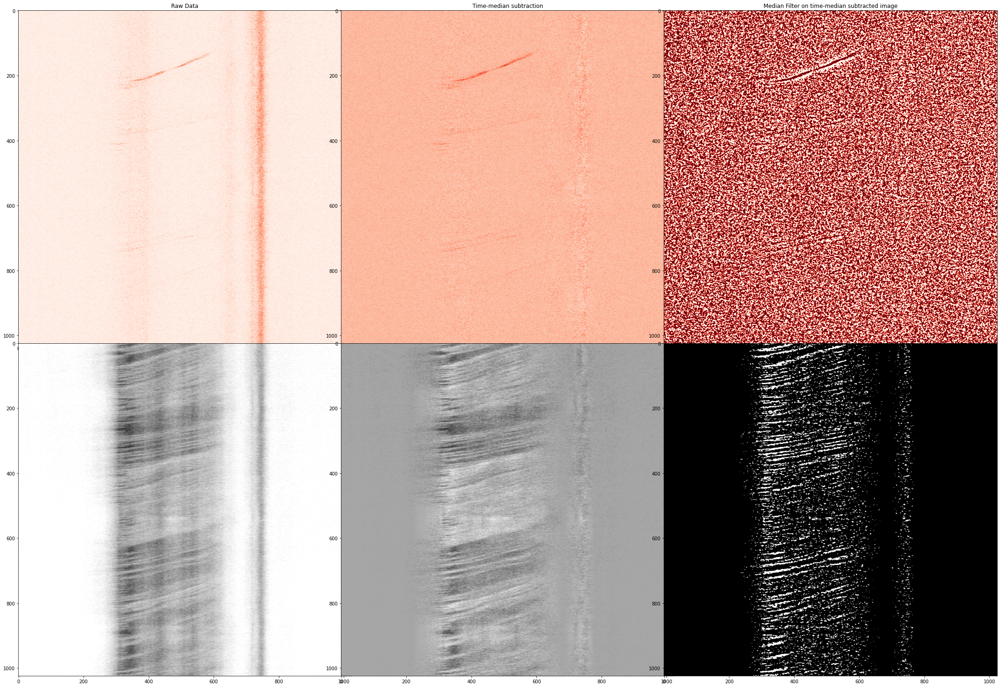

In [17]:
fig, axs = plt.subplots(2,3, figsize=set_size('beamer', fraction=10, subplots=(2,2)))
fig.subplots_adjust(hspace =0, wspace=-.3)
axs = axs.ravel()

axs[0].imshow(red[1,:,:],cmap = "Reds")
axs[1].imshow(red_sub[1],cmap = "Reds")
axs[2].imshow(red_filt[1],cmap="Reds")
axs[3].imshow(grey[1,:,:],cmap = "binary")
axs[4].imshow(grey_sub[1],cmap = "binary")
axs[5].imshow(grey_filt[1],cmap="binary")

axs[0].set_title('Raw Data')
axs[1].set_title('Time-median subtraction')
axs[2].set_title('Median Filter on time-median subtracted image')



## Prepare for hough transform 

* houghlines looks for white pixels, so we need to flip our image. 
* apply a median blur to better connect the lines
* 

In [ ]:
# Initialize output
img = np.uint8(grey_filt_thresh[0].copy())


out = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

# Median blurring to get rid of the noise; invert image
img = 255 - cv2.medianBlur(img, 3)

# Detect and draw lines
lines = cv2.HoughLinesP(img, 1, np.pi/180, 10, minLineLength=50, maxLineGap=30)
for line in lines:
    for x1, y1, x2, y2 in line:
        cv2.line(out, (x1, y1), (x2, y2), (0, 0, 255), 2)

cv2.imshow('out', out)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
from skimage.transform import hough_line, hough_line_peaks
from skimage.filters import roberts
from skimage.draw import line

from skimage.transform import (hough_line, hough_line_peaks,
                               probabilistic_hough_line)

from matplotlib import cm

from skimage import measure


image = binary_adaptive.copy()

contours = measure.find_contours(image, 0.8)

# Classic straight-line Hough transform
# Set a precision of 0.5 degree.
# tested_angles = np.linspace(-np.pi / 2, np.pi / 2, 360, endpoint=False)
h, theta, d = hough_line(image)

# Line finding using the Probabilistic Hough Transform.
plt.figure(figsize = (20,20))
plt.imshow(contours)



In [ ]:
# Python program to illustrate HoughLine
# method for line detection
import cv2

# Reading the required image in
# which operations are to be done.
# Make sure that the image is in the same
# directory in which this python program is

img = np.uint8(binary_adaptive)

# # Convert the img to grayscale
# gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# Apply edge detection method on the image
# edges = cv2.Canny(img,1,1,apertureSize = 3)

# This returns an array of r and theta values
lines = cv2.HoughLines(img,1,np.pi/180, 200)

# The below for loop runs till r and theta values
# are in the range of the 2d array
for r,theta in lines[0]:
	
	# Stores the value of cos(theta) in a
	a = np.cos(theta)

	# Stores the value of sin(theta) in b
	b = np.sin(theta)
	
	# x0 stores the value rcos(theta)
	x0 = a*r
	
	# y0 stores the value rsin(theta)
	y0 = b*r
	
	# x1 stores the rounded off value of (rcos(theta)-1000sin(theta))
	x1 = int(x0 + 1000*(-b))
	
	# y1 stores the rounded off value of (rsin(theta)+1000cos(theta))
	y1 = int(y0 + 1000*(a))

	# x2 stores the rounded off value of (rcos(theta)+1000sin(theta))
	x2 = int(x0 - 1000*(-b))
	
	# y2 stores the rounded off value of (rsin(theta)-1000cos(theta))
	y2 = int(y0 - 1000*(a))
	
	# cv2.line draws a line in img from the point(x1,y1) to (x2,y2).
	# (0,0,255) denotes the colour of the line to be
	#drawn. In this case, it is red.
	cv2.line(img,(x1,y1), (x2,y2), (0,0,255),2)
	
# All the changes made in the input image are finally
# written on a new image houghlines.jpg
cv2.imwrite('linesDetected.jpg', img)


## Identify leukocytes and RBCS 


*Approach: *
* Start by examining autocor of the signal (columnwise) - column with clearest oscillatory component can be used. 
* Plot the trace for the chosen column
* Determine threshold to use for what counts as a RBC or leukocyte
* Index cell position 
* Create PSTH for RBC count within leukocyte position
* Plot save all leukocyte histograms for visual inspection
* Develope functions for outcome measures

In [ ]:
# Plot single column of intensity over time 
fig, axs = plt.subplots(5,1, figsize=set_size('beamer', fraction=10, subplots=(2,2)))
fig.subplots_adjust(hspace =.2, wspace=-.6)
axs = axs.ravel()

axs[0].plot(grey_filt[0][:,350],color = 'grey')
axs[1].plot(grey_filt[0][:,500],color = 'grey')
axs[2].plot(grey_filt[0][:,600],color = 'grey')
axs[3].plot(grey_filt[0][:,400],color = 'grey')


axs[0].scatter(np.argmin(grey_filt[0][0,:]),0,color = 'grey')

# axs[0].plot(np.mean(grey_filt[0][:,500],axis=1),color = 'black')


plt.show()

In [ ]:
fig, axs = plt.subplots(5,1, figsize=set_size('beamer', fraction=10, subplots=(2,2)))
fig.subplots_adjust(hspace =.2, wspace=-.6)
axs = axs.ravel()

axs[0].plot(np.argmax(red_filt[39],axis = 1))
# min_val = []
# for frame in grey_filt:
#     plt.plot(np.argmin(frame,axis = 0))
    

In [ ]:
from scipy import signal
sig = grey_filt[:,400]
corr = signal.correlate(sig, sig)
lags = signal.correlation_lags(len(sig), len(sig))
corr_sig = corr/ np.max(corr)
lag = lags[np.argmax(corr_sig)]
idx = [int(np.round(lags.shape[0]/2)-830),int(np.round(lags.shape[0]/2)+830)]


fig, (ax_orig, ax_corr) = plt.subplots(2, 1, figsize=(4.8, 4.8))
ax_orig.plot(sig)
ax_orig.set_title('Original signal')
ax_orig.set_xlabel('Sample Number')
ax_corr.plot(lags, corr)
ax_corr.set_title('Cross-correlated signal')
ax_corr.set_xlabel('Lag')
ax_orig.margins(0, 0.1)
ax_corr.margins(0, 0.1)
fig.tight_layout()
plt.show()

In [ ]:
from neurodsp.filt import filter_signal
from neurodsp.plts.time_series import plot_time_series

# for col in np.arange(red_filt.shape[1]): 

x = grey_filt[:,500]
fs = 1666

# Define a frequency range to filter the data
f_range = (50, fs/2-1)

# Bandpass filter the data, across the band of interest
sig_filt = filter_signal(x, fs, 'bandpass', f_range)

plot_time_series(np.linspace(0,0.6,x.shape[0]), [x, sig_filt], ['Raw', 'Filtered'])


In [ ]:
from neurodsp.spectral import compute_spectrum, rotate_powerlaw

# Import utilities for loading and plotting data
from neurodsp.utils import create_times
from neurodsp.utils.download import load_ndsp_data
from neurodsp.plts.spectral import plot_power_spectra
from neurodsp.plts.time_series import plot_time_series


sig = grey_filt[:,500]
fs = 1666

# Mean of spectrogram (Welch)
freq_mean, psd_mean = compute_spectrum(sig, fs, method='welch', avg_type='mean', nperseg=fs*2)

# Median of spectrogram ("median Welch")
freq_med, psd_med = compute_spectrum(sig, fs, method='welch', avg_type='median', nperseg=fs*2)

# Median filtered spectrum
freq_mf, psd_mf = compute_spectrum(sig, fs, method='medfilt')

plt.plot(sig)
# Plot the power spectra
plot_power_spectra([freq_mean[:200], freq_med[:200], freq_mf[100:10000]],
                   [psd_mean[:200], psd_med[:200], psd_mf[100:10000]],
                   ['Welch', 'Median Welch', 'Median Filter FFT'])